# TIK TOK - REPORTS EFFICIENT PRIORITIZATION

INTRODUCTION & CONTEXT

To be as safe as it can, TikTok offers its users the possibility to report videos and comment. Thanks to this procedure, an user can identify a video/comment containing a claim.
If this is done, a moderator steps in to review the video and check whether or not it includes a claim or it shares just an opinion.
In details, an “opinion” refers to an individual’s or group’s personal belief or thought. A “claim” refers to information that is either unsourced or from an unverified source.

The issue is that, due to the number of active users on TikTok, the amount of user reports piles up quickly.

ANALYSIS DETAILS

The main goal is to lower the user reports' backlog by prioritizing them more effectively.

Speaking of available data, it is both highly reliable, original and recent since it comes directly from TikTok and are data taken from the last claims.
It is also comprehensive, even though some more information about different aspects of the video/comment itself (as topic, keywords, etc) may have been helpful.
Obviously, due to its nature (TikTok's private data), data is not cited.

Speaking of the dataset employed, it has 19,383 rows and 12 columns. These variables are: #, claim_status, video_id, video_duration_sec, video_transcription_text, verified_status, author_ban_status, video_view_count, video_like_count, video_share_count, video_download_count and video_comment_count.

PACKAGE IMPORT

The first thing to do in any DA is to import the needed packages. 
We will rely on numpy, pandas, matplot and picke for EDA. Plus, thanks to the scikit-learn and xgboost packages we will be able to build different ML models.

In [2]:
# Import `numpy`, `pandas`, `pickle`, and `sklearn`.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle as pkl
import seaborn as sns
# Import the relevant functions from `sklearn.ensemble`, `sklearn.model_selection`, and `sklearn.metrics`.
from sklearn.model_selection import train_test_split, PredefinedSplit, GridSearchCV
from xgboost import XGBClassifier, plot_importance
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score,\
classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.model_selection import GridSearchCV
from sklearn import naive_bayes
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
# This module lets us save our models once we fit them.
import pickle
# This lets us see all of the columns, preventing Juptyer from redacting them.
pd.set_option('display.max_columns', None)

KeyboardInterrupt: 

DATA LOADING

After importing the needed packages, the dataset must be loaded.
We will load the dataset and display its first 10 rows to get an idea.

In [ ]:
#load the dataset
claim = pd.read_csv("inData/tiktok_dataset.csv")
#display first 10 rows
claim.head(10)


,#,claim_status,video_id,video_duration_sec,video_transcription_text,verified_status,author_ban_status,video_view_count,video_like_count,video_share_count,video_download_count,video_comment_count
0,1,claim,7017666017,59,someone shared with me that drone deliveries a...,not verified,under review,343296.0,19425.0,241.0,1.0,0.0
1,2,claim,4014381136,32,someone shared with me that there are more mic...,not verified,active,140877.0,77355.0,19034.0,1161.0,684.0
2,3,claim,9859838091,31,someone shared with me that american industria...,not verified,active,902185.0,97690.0,2858.0,833.0,329.0
3,4,claim,1866847991,25,someone shared with me that the metro of st. p...,not verified,active,437506.0,239954.0,34812.0,1234.0,584.0
4,5,claim,7105231098,19,someone shared with me that the number of busi...,not verified,active,56167.0,34987.0,4110.0,547.0,152.0
5,6,claim,8972200955,35,someone shared with me that gross domestic pro...,not verified,under review,336647.0,175546.0,62303.0,4293.0,1857.0
6,7,claim,4958886992,16,someone shared with me that elvis presley has ...,not verified,active,750345.0,486192.0,193911.0,8616.0,5446.0
7,8,claim,2270982263,41,someone shared with me that the best selling s...,not verified,active,547532.0,1072.0,50.0,22.0,11.0
8,9,claim,5235769692,50,someone shared with me that about half of the ...,not verified,active,24819.0,10160.0,1050.0,53.0,27.0
9,10,claim,4660861094,45,someone shared with me that it would take a 50...,verified,active,931587.0,171051.0,67739.0,4104.0,2540.0


DATA CLEANING

Cleaning data is fundamental in any properly-performed analysis.

To begin with, we will understand the data type of the variables.

In [ ]:
#check vars data type
claim.dtypes

#                             int64
claim_status                 object
video_id                      int64
video_duration_sec            int64
video_transcription_text     object
verified_status              object
author_ban_status            object
video_view_count            float64
video_like_count            float64
video_share_count           float64
video_download_count        float64
video_comment_count         float64
dtype: object

The dataset is a mix of object and float data. The only int is the number assigned by TikTok to the video with claim/opinion.

Now, let's display the number of unique values within each variable.


In [ ]:
#number of unique values
claim.nunique()

#                           19382
claim_status                    2
video_id                    19382
video_duration_sec             56
video_transcription_text    19012
verified_status                 2
author_ban_status               3
video_view_count            15632
video_like_count            12224
video_share_count            9231
video_download_count         4336
video_comment_count          2424
dtype: int64

Two things are worth nothing here: 

1. Later on, it may be necessary to one-hot encode our categorical variables. Therefore, we will now display the unique values in these specific columns.

2. video_transcription_text is excluded by point 1 due to its nature: it is the video's transcription, thus it is reasonable to expect any item to be different from the other. However, nunique() told us this is not the case. Two situation can lead to that: either there are duplicate videos (with the same description) or there are some NAs. We need to investigate that further.

Let's focus on point 1 first.

In [ ]:
# loop to display unique values in each object column (excluding the description) 
for col in ["claim_status", "verified_status", "author_ban_status"]:
    print(f"Unique values in {col}: {claim[col].unique()}\n")

Unique values in claim_status: ['claim' 'opinion' nan]

Unique values in verified_status: ['not verified' 'verified']

Unique values in author_ban_status: ['under review' 'active' 'banned']



This shows that:
- claim status has some missing data, and we must deal with this before building our model. Once this is handled, it basically becomes a boolean variable.
- Verified_status is basically a boolean variable. We could change it to that data type later on.
- author_ban_status has 3 different class. We may one-hot-encode that colum later on. It will lead to 2 new columns.

We will keep these consideration aside for a moment, and we will focus on point 2. 

Turning our focus on video_transcription_text, we will first look for missing values.

In [ ]:
#check for missing values in video_transcription_text
missing_values = claim["video_transcription_text"].isnull().sum()
print(f"Number of missing values: {missing_values}")

Number of missing values: 298


It appears that this variable has 298 NAs. This clears part of our doubts: it has 19012 unique values + 298 NAs for a total of 19,310 observations. We will deal later with NA.

This means there are 72 missing. Let's check for duplicates values.
We'll define a function first, then apply that function to our data.

In [ ]:
#define a function to count duplicates
def count_duplicates_without_nan(df, column=None):
    if column:
        # Exclude NaN values before checking for duplicates
        return df[df[column].notnull()].duplicated(subset=[column]).sum()
    else:
        duplicate_counts = {}
        for col in df.columns:
            # Exclude NaN values before checking for duplicates in each column
            duplicate_counts[col] = df[df[col].notnull()].duplicated(subset=[col]).sum()
        return duplicate_counts

In [ ]:
#check duplicates
print("Duplicates values excluding NaNs are:" , count_duplicates_without_nan(claim, column = "video_transcription_text"))

Duplicates values excluding NaNs are: 72


As we expected, the number of duplicates rows (excluding the NaNs) are 72.

Having the same description may suggest that either the video/comment has been reported more than 1 time or it has been registred more than one time.
We'll save these consideration for later on.

Let's now turn to missing value. Let's check how many NaN there are in each column. 

In [ ]:
#checking NaN
claim.isnull().sum()

#                             0
claim_status                298
video_id                      0
video_duration_sec            0
video_transcription_text    298
verified_status               0
author_ban_status             0
video_view_count            298
video_like_count            298
video_share_count           298
video_download_count        298
video_comment_count         298
dtype: int64

Except for those variables that have none, all the other have the same amount of NaN. 
Let's check where are these NaNs. Again, first we will define a function then we will run it on our dataset.

In [ ]:
#function to display the rows with Nan
def display_rows_with_nan(df):
    """
    Displays rows in the DataFrame that have NaN values in at least one column.
    
    Parameters:
        df (pd.DataFrame): The DataFrame to check.
    
    Returns:
        pd.DataFrame: Rows with at least one NaN value.
    """
    # Filter rows with NaN values in any column
    rows_with_nan = df[df.isnull().any(axis=1)]
    return rows_with_nan

In [ ]:
# Set the display option to show all rows
pd.set_option('display.max_rows', None)
#check for rows with Nan
display_rows_with_nan(claim)

,#,claim_status,video_id,video_duration_sec,video_transcription_text,verified_status,author_ban_status,video_view_count,video_like_count,video_share_count,video_download_count,video_comment_count
19084,19085,NaN,4380513697,39,NaN,not verified,active,NaN,NaN,NaN,NaN,NaN
19085,19086,NaN,8352130892,60,NaN,not verified,active,NaN,NaN,NaN,NaN,NaN
19086,19087,NaN,4443076562,25,NaN,not verified,active,NaN,NaN,NaN,NaN,NaN
19087,19088,NaN,8328300333,7,NaN,not verified,active,NaN,NaN,NaN,NaN,NaN
19088,19089,NaN,3968729520,8,NaN,not verified,active,NaN,NaN,NaN,NaN,NaN
19089,19090,NaN,1294150914,16,NaN,not verified,active,NaN,NaN,NaN,NaN,NaN
19090,19091,NaN,9656495988,41,NaN,not verified,active,NaN,NaN,NaN,NaN,NaN
19091,19092,NaN,9315592484,7,NaN,not verified,active,NaN,NaN,NaN,NaN,NaN
19092,19093,NaN,2697223671,43,NaN,not verified,active,NaN,NaN,NaN,NaN,NaN
19093,19094,NaN,3165543455,51,NaN,verified,active,NaN,NaN,NaN,NaN,NaN


The NaN of different columns are all in the same 298 rows. Notably, all these rows have NaN in the claim_status column.

Let's consider what % of our dataframe this is.

In [ ]:
#check NaN as %
298/len(claim) * 100

1.5375090289959756

The missing rows are around the 1.5% of our df. Therefore, by opting for not considering them, we will not lose that much information.

Indeed, to avoid issues when it's time for modeling, we are going to drop the NaNs.

Note. We drop them since they are all NaN also in the claim_status. This is one of the most important column in the dataset as it shows whether a video is a claim or an opinion. A NaN in this variable entails losing a lot of information and makes dropping that row not a big deal.

In [ ]:
# Drop NaNs
# Save the DataFrame in variable subset
claim_subset = claim.dropna(axis=0).reset_index(drop=True)

In [ ]:
#show the new df
print(claim_subset)

           # claim_status    video_id  video_duration_sec  \
0          1        claim  7017666017                  59   
1          2        claim  4014381136                  32   
2          3        claim  9859838091                  31   
3          4        claim  1866847991                  25   
4          5        claim  7105231098                  19   
5          6        claim  8972200955                  35   
6          7        claim  4958886992                  16   
7          8        claim  2270982263                  41   
8          9        claim  5235769692                  50   
9         10        claim  4660861094                  45   
10        11        claim  8095102436                  47   
11        12        claim  4507218541                  30   
12        13        claim  3609761483                  51   
13        14        claim  3850678773                  20   
14        15        claim  1656032315                  42   
15        16        clai

To conclude the data cleaning process, let's check for outliers. 
Note. It is possible to check for outliers only in continuos variables.

In [ ]:
#Define a function to check for outliers with IQR range or Z-score
def count_outliers(df, method='iqr', threshold=3):
    outlier_counts = {}

    for column in df.select_dtypes(include=[np.number]).columns:  # Only consider numeric columns
        if method == 'iqr':
            # IQR method
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            outliers = ((df[column] < (Q1 - 1.5 * IQR)) | (df[column] > (Q3 + 1.5 * IQR)))
        elif method == 'zscore':
            # Z-score method
            mean = df[column].mean()
            std_dev = df[column].std()
            z_scores = (df[column] - mean) / std_dev
            outliers = (z_scores.abs() > threshold)
        else:
            raise ValueError("Method must be 'iqr' or 'zscore'")
        
        outlier_counts[column] = outliers.sum()  # Count True values indicating outliers

    return outlier_counts

In [ ]:
#count outliers
quantsubset = claim_subset[["video_duration_sec", "video_view_count", "video_like_count", 
                            "video_share_count", "video_download_count", "video_comment_count"]]
#iqr method
print(count_outliers(quantsubset))
#Z-score method
print(count_outliers(quantsubset, method = "zscore", threshold=3))

{'video_duration_sec': 0, 'video_view_count': 0, 'video_like_count': 1726, 'video_share_count': 2508, 'video_download_count': 2450, 'video_comment_count': 2789}
{'video_duration_sec': 0, 'video_view_count': 0, 'video_like_count': 397, 'video_share_count': 537, 'video_download_count': 516, 'video_comment_count': 486}


Even though the inter-quartile method identifies a far higher number of outliers than the Z score, there are not that much outliers.

Anyhow, we will write down this number for our personal reference. Yet, it is important to remember that many ML models handle outliers pretty well.

Before declaring the cleaning phase as concluded, let get back to the column about the video description and examine all the duplicates rows.


In [ ]:
#function to display duplicate rows
def display_duplicate_rows(df, column):
    """
    Displays all rows of the DataFrame where the specified column has duplicate values.
    
    Parameters:
        df (pd.DataFrame): The DataFrame to check.
        column (str): The column to find duplicates in.
    
    Returns:
        pd.DataFrame: Rows where the specified column has duplicate values.
    """
    # Identify the duplicated values in the specified column
    duplicate_mask = df[column].duplicated(keep=False)
    # Filter and return rows where duplicates exist in the specified column
    return df[duplicate_mask]

In [ ]:
#show duplicates rows in the column description
display_duplicate_rows(claim_subset, column = "video_transcription_text")

,#,claim_status,video_id,video_duration_sec,video_transcription_text,verified_status,author_ban_status,video_view_count,video_like_count,video_share_count,video_download_count,video_comment_count
2499,2500,claim,2214644684,11,a friend read in the media that badminton is ...,not verified,under review,932366.0,183222.0,40895.0,3880.0,1419.0
2502,2503,claim,2307103802,36,a friend read in the media that there are cur...,not verified,active,630298.0,112281.0,6897.0,2264.0,1275.0
2504,2505,claim,1739414075,25,a friend read in the media that a common gard...,not verified,banned,916439.0,140985.0,49458.0,2346.0,1037.0
2505,2506,claim,6457026547,30,a friend read in the media that adult cats on...,not verified,active,232075.0,77163.0,26903.0,164.0,29.0
2510,2511,claim,2425568026,15,a friend read in the media that artificial ba...,not verified,active,338293.0,44921.0,13179.0,869.0,328.0
2528,2529,claim,1898786911,32,a friend read in the media that the roar of a...,not verified,under review,336717.0,62882.0,12760.0,1473.0,893.0
2534,2535,claim,7983327984,23,a friend read in the media a claim that icela...,not verified,active,977332.0,202820.0,12787.0,593.0,82.0
2540,2541,claim,4191986133,37,a friend read in the media a claim that the m...,not verified,banned,966392.0,246624.0,66651.0,2915.0,1925.0
2542,2543,claim,2777834050,51,a friend read in the media a claim that badmi...,not verified,under review,493914.0,30731.0,9668.0,167.0,95.0
2548,2549,claim,6553958541,12,a friend read in the media a claim that there...,not verified,active,291027.0,40589.0,3817.0,231.0,65.0


We must be more specific here. Let's depict how many time a transcription is repeated.

In [ ]:
def display_duplicate_values_with_counts(df, column):
    """
    Displays the duplicate values in a column along with the count of how many times each value is repeated.
    
    Parameters:
        df (pd.DataFrame): The DataFrame to check.
        column (str): The column to find duplicate values in.
    
    Returns:
        pd.DataFrame: A DataFrame with columns 'duplicate_entry' and 'count'.
    """
    # Get value counts for the column
    value_counts = df[column].value_counts()
    # Filter only values that are duplicated (appear more than once)
    duplicate_values = value_counts[value_counts > 1]
    # Convert to a DataFrame with desired column names
    duplicate_values_df = duplicate_values.reset_index()
    duplicate_values_df.columns = ["duplicate_entry", "count"]  # Set exact column names
    # Sort the DataFrame by count in descending order
    duplicate_values_df = duplicate_values_df.sort_values(by="count", ascending=False)
    return duplicate_values_df


In [ ]:
display_duplicate_values_with_counts(claim_subset, "video_transcription_text")

,duplicate_entry,count
0,a friend read in the media a claim that badmi...,2
1,someone read in the media a claim that techni...,2
52,a friend read in the media a claim that there...,2
51,a colleague read in the media a claim that th...,2
50,a colleague read in the media a claim that do...,2
49,a friend read in the media a claim that the l...,2
48,someone read in the media that the longest re...,2
47,i read in the media a claim that every three ...,2
46,someone read in the media a claim that sputni...,2
45,someone learned from the media that cats can'...,2


As evident, all the duplicate entries occur for 2 time. This is a piece of information that may come handy later. Indeed, if a video is reported more than 1 time, this may ring a bell not only to carefully review that video but also to the possibility of it really be an user's claim.
That's the reason why we do not drop these duplicates.

Note: description appears as duplicate while video_id does not since they refer to two different thing: the former refers to the claim while the latter to the video. Hence, if a video is reported more than 1 time, it will have different claim id. If duplicates were in the video_id, then we will be more concered about the possibility of a mistake. Indeed, this is a random number assigned to the video.

DATA EXPLORATION

EDA plays a crucial role in understanding data. 

Let's compute some basic statistics for our df.

In [ ]:
#function to print summary statistics of chosen columns
def describe_with_exclusion(df, exclude_columns, decimals=2):
    """
    Computes summary statistics for only numerical columns, excluding specified columns, 
    and ensures the result is rounded to the specified number of decimals.
    
    Parameters:
        df (pd.DataFrame): The DataFrame to compute statistics on.
        exclude_columns (list): List of column names to exclude.
        decimals (int): Number of decimal places to display.
    
    Returns:
        pd.DataFrame: Summary statistics for numerical columns excluding specified columns, rounded to the specified decimals.
    """
    # Drop the specified columns to exclude
    df_filtered = df.drop(columns=exclude_columns)
    # Select only numerical columns
    df_numerical = df_filtered.select_dtypes(include=[np.number])
    # Compute summary statistics for numerical columns and round to the specified decimals
    return df_numerical.describe().round(decimals)


In [ ]:
#summary statistics for the df
describe_with_exclusion(claim_subset, exclude_columns = ["#", "video_id"], decimals=2)

,video_duration_sec,video_view_count,video_like_count,video_share_count,video_download_count,video_comment_count
count,19084.00,19084.00,19084.00,19084.00,19084.00,19084.00
mean,32.42,254708.56,84304.64,16735.25,1049.43,349.31
std,16.23,322893.28,133420.55,32036.17,2004.30,799.64
min,5.00,20.00,0.00,0.00,0.00,0.00
25%,18.00,4942.50,810.75,115.00,7.00,1.00
50%,32.00,9954.50,3403.50,717.00,46.00,9.00
75%,47.00,504327.00,125020.00,18222.00,1156.25,292.00
max,60.00,999817.00,657830.00,256130.00,14994.00,9599.00


Descriptive statistics provides some useful insights. The worth noting are:

- There is at least 1 video that has no comment, 1 that has no sharing, 1 that has no download, 1 that has no likes and 1 that has no comments.
- Not surpisingly, the avergae video duration is around 30sec and the maximum is 60sec. This does not come as a surprise since TikTok is a short-videos sharing platform.
- Standard deviation for views and likes is quite high, showing a high variation within this measures.
- Related to the previous point, the range between which views and like lay is quite vast (goning from 0 or 20 to 657830.00 or 999817.00)
- Data realted to sharing count displays a wide range too, however the sd is smaller than view and likes. This suggests that share's count tend to concentrate near the mean

Anyhow, the main thing we must be aware of is that we must standardize our data for those models that require it. Indeed, magnitude of duration is enormously different than views. 
We'll keep that in mind for later.

Let's display data in boxplots.

In [ ]:
#build a function to displays boxplot to better understand it.
def col_boxplots(df, columns=None):
    """
    Plots individual box plots for each specified column in the DataFrame.
    
    Parameters:
    - df: The DataFrame containing the data.
    - columns: List of columns to plot. If None, plots all numeric columns.
    """
    # If no columns are specified, use all numeric columns
    if columns is None:
        columns = df.select_dtypes(include='number').columns
    
    # Set up the subplots
    num_columns = len(columns)
    fig, axes = plt.subplots(num_columns, 1, figsize=(8, num_columns * 2), squeeze=False)
    
    # Plot each column on a separate subplot
    for i, column in enumerate(columns):
        sns.boxplot(data=df, x=column, ax=axes[i, 0])
        axes[i, 0].set_title(f'Box plot of {column}')
        axes[i, 0].set_xlabel('Values')
        axes[i, 0].set_ylabel(column)
    
    plt.tight_layout()
    plt.show()

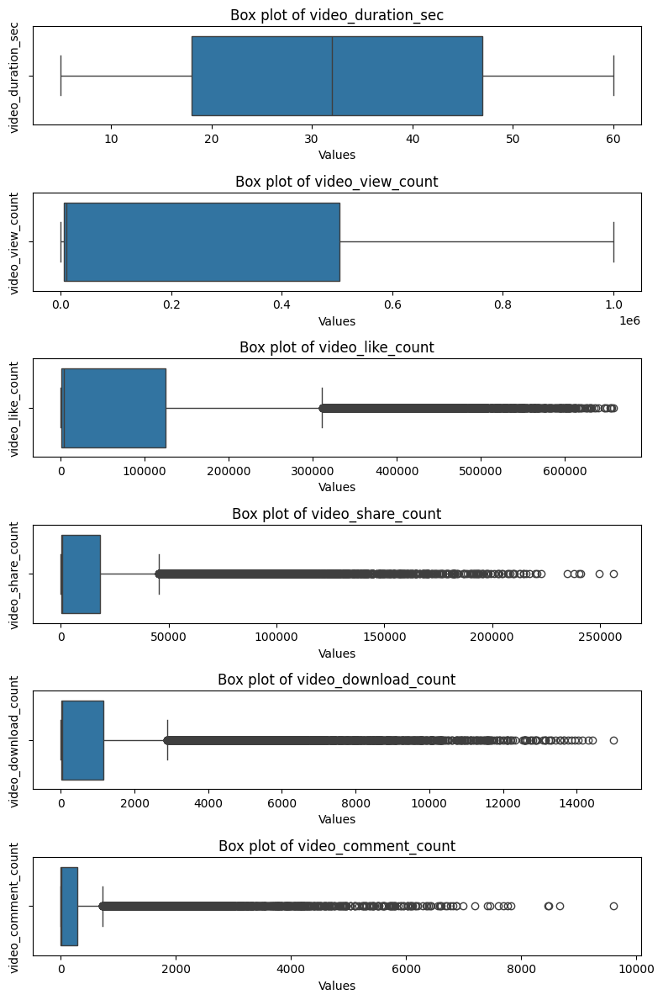

In [ ]:
col_boxplots(claim_subset, columns = ["video_duration_sec", "video_view_count", "video_like_count", "video_share_count", "video_download_count", "video_comment_count"])

As we saw above, many variables move within a broad range. That was predictable, as TikTok hosts any kind of videos coming from different people. Indeed, video going "viral" have an elevate amount of visualization, share, comments etc, while video coming from less followed people generally attract far less interaction.

Turning to categorical variable, the most informative measure is the mode. Let's compute it.

In [ ]:
#function to compute the modes for different column
def compute_modes(df, columns):
    """
    Computes the mode(s) for the specified categorical columns in the DataFrame,
    and includes how many times the mode(s) appear.
    
    Parameters:
        df (pd.DataFrame): The DataFrame containing the data.
        columns (list): List of column names for which to compute the mode(s).
    
    Returns:
        pd.DataFrame: A DataFrame with three columns: column names, mode(s), and their counts.
    """
    modes = []
    for col in columns:
        # Compute the mode(s) for the column
        mode_values = df[col].mode().tolist()
        # Get the count of the first mode value
        mode_count = df[col].value_counts().loc[mode_values[0]] if mode_values else 0
        modes.append({"column": col, "mode": mode_values, "count": mode_count})
    
    # Convert the result into a DataFrame
    return pd.DataFrame(modes)


In [ ]:
#compute the mode
compute_modes(claim_subset, columns = ["claim_status", "verified_status", "author_ban_status"])

,column,mode,count
0,claim_status,[claim],9608
1,verified_status,[not verified],17884
2,author_ban_status,[active],15383


Modes show that among the reported videos, the many are from not verified author. At the same time, most of the authors are active.

Let's build histograms for each class. 

In [ ]:
#function to plot histogram
def plot_histograms(df, columns):
    """
    Plots histograms for the specified columns of a DataFrame.
    The x-axis represents unique values, and the y-axis represents their count.
    
    Parameters:
        df (pd.DataFrame): The DataFrame containing the data.
        columns (list): List of column names to plot histograms for.
    
    Returns:
        None
    """
    for col in columns:
        plt.figure(figsize=(10, 6))
        # Create a count plot for the column
        sns.countplot(
            data=df, 
            x=col, 
            order=df[col].value_counts().index, 
            hue=col,  # Assign x to hue for consistency
            palette="viridis", 
            legend=False  # Hide the legend
        )
        # Add labels and title
        plt.title(f"Histogram of {col}", fontsize=16)
        plt.xlabel(col, fontsize=14)
        plt.ylabel("Count", fontsize=14)
        plt.xticks(rotation=45, fontsize=12)
        # Show the plot
        plt.tight_layout()
        plt.show()


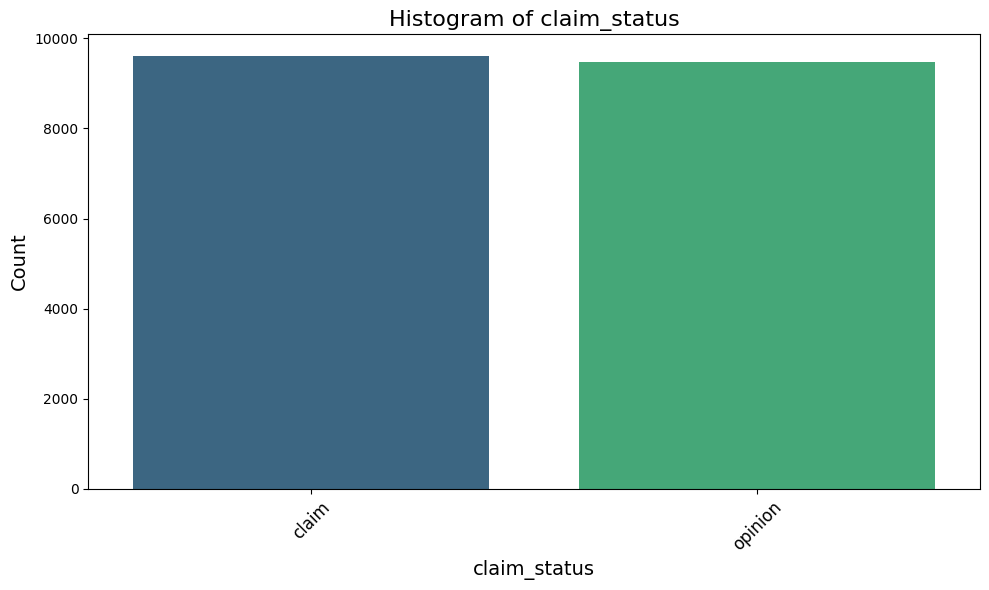

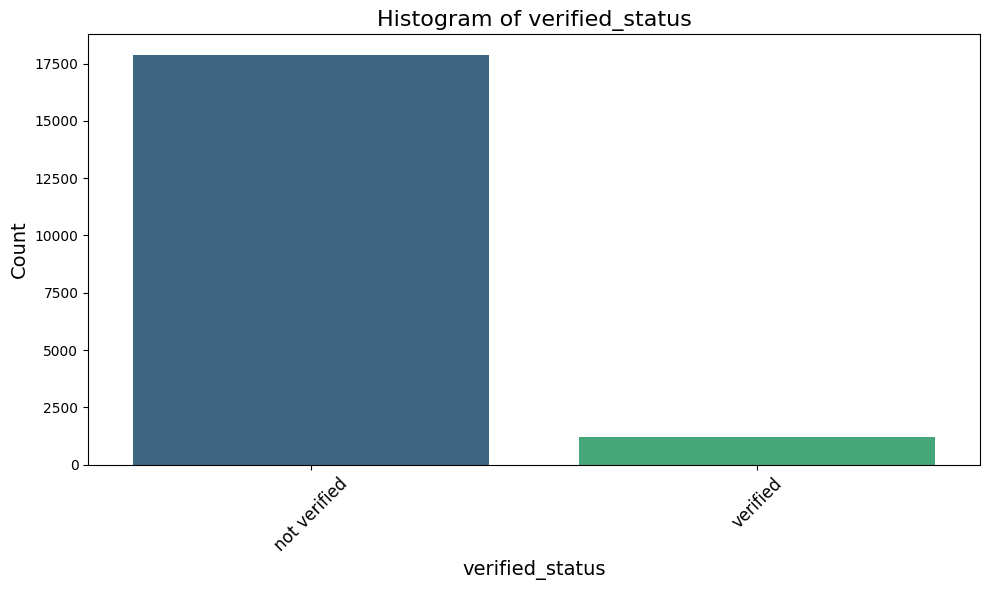

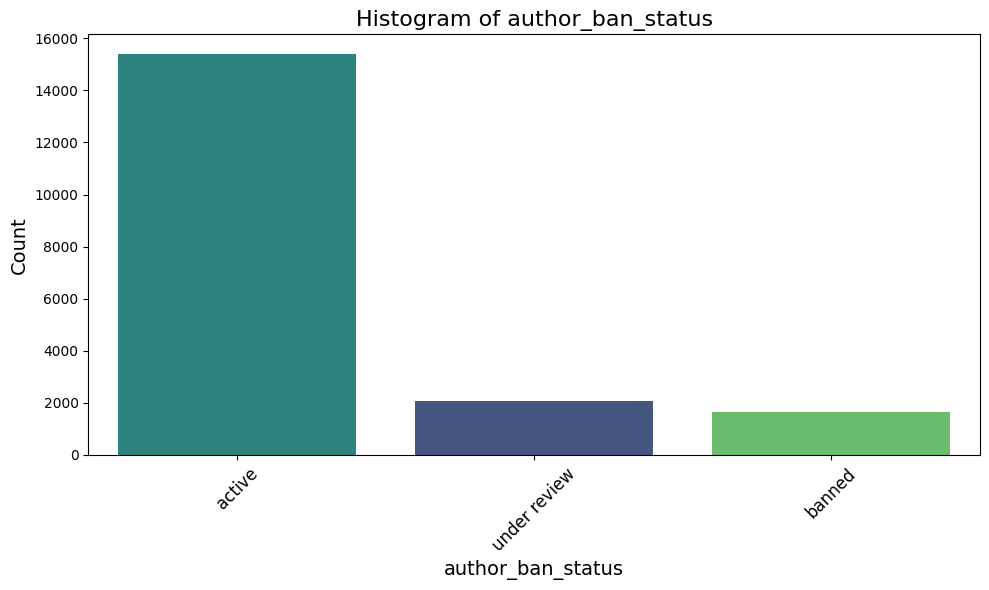

In [ ]:
#show histograms
plot_histograms(claim_subset, columns = ["claim_status", "verified_status", "author_ban_status"])

As evident, there is a marked imbalance between active, under review and banned users, with the former taking the most observation. Plus, there is a significant imabalance even in the verfied_status column, where the not_verified has the major number of observation.

On a good note, claim status are balanced almost perfectly.

FEATURE ENGINEERING

Feature Selection

Selecting the features to include in the model is crucial. Let's have, once again, a view of all the features avaiable.

In [ ]:
claim_subset.columns

Index(['#', 'claim_status', 'video_id', 'video_duration_sec',
       'video_transcription_text', 'verified_status', 'author_ban_status',
       'video_view_count', 'video_like_count', 'video_share_count',
       'video_download_count', 'video_comment_count'],
      dtype='object')

Metadata usually do not add explanatory power to the model. Therefore, we will not consider the variable # (that is a claim count) and video_id (that is the video's identifier).

All the other variables may be helpful in our model. 

A special note, goes, again to video_transcription_text. By itself, we do not expect this columns to have a high explanation power, since it varies a lot (being natural language) from video to video.
However, this variable can become a gold mine of information if we manage to extract some keywords from the text. That's the reason why it may be reasonable to keep it in the df. However, at the moment, we are going to drop it for the sake of easiness.

For now, let's drop #, video_id and video_transcription_text columns.

In [ ]:
#drop not usueful column
claim_analysis = claim_subset.drop(["#", "video_id", "video_transcription_text"], axis = 1)
print(claim_analysis)

      claim_status  video_duration_sec verified_status author_ban_status  \
0            claim                  59    not verified      under review   
1            claim                  32    not verified            active   
2            claim                  31    not verified            active   
3            claim                  25    not verified            active   
4            claim                  19    not verified            active   
5            claim                  35    not verified      under review   
6            claim                  16    not verified            active   
7            claim                  41    not verified            active   
8            claim                  50    not verified            active   
9            claim                  45        verified            active   
10           claim                  47    not verified            active   
11           claim                  30    not verified            active   
12          

Finally, let's check for multicollinearity. 
We expect views, share and downloads to be somehow related. Moreover, even likes and comments may have some sort of relation.

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def check_multicollinearity(df, method="correlation", threshold=0.7):
    """
    Checks for multicollinearity in the numerical columns of the DataFrame.
    
    Parameters:
        df (pd.DataFrame): The DataFrame containing the data.
        method (str): Method to use for checking multicollinearity.
                      "correlation" - Show correlation matrix with high correlations flagged.
                      "vif" - Compute Variance Inflation Factor (VIF) for numerical columns.
        threshold (float): Correlation threshold for flagging multicollinearity (for correlation method).
    
    Returns:
        pd.DataFrame or dict: Correlation matrix or VIF scores depending on the method.
    """
    # Select only numerical columns
    numerical_df = df.select_dtypes(include=[np.number])
    
    if method == "correlation":
        # Compute the correlation matrix
        corr_matrix = numerical_df.corr()
        # Flag correlations above the threshold
        high_corr = (corr_matrix.abs() >= threshold) & (corr_matrix != 1.0)
        return corr_matrix, high_corr
    
    elif method == "vif":
        # Compute VIF for each numerical column
        vif_data = pd.DataFrame()
        vif_data["feature"] = numerical_df.columns
        vif_data["VIF"] = [variance_inflation_factor(numerical_df.values, i) for i in range(len(numerical_df.columns))]
        return vif_data
    
    else:
        raise ValueError("Invalid method. Use 'correlation' or 'vif'.")

In [ ]:
#correlation Matrix
check_multicollinearity(claim_analysis, method="correlation", threshold=0.7)

(                      video_duration_sec  video_view_count  video_like_count  \
 video_duration_sec              1.000000          0.008481          0.011567   
 video_view_count                0.008481          1.000000          0.804322   
 video_like_count                0.011567          0.804322          1.000000   
 video_share_count               0.011560          0.665635          0.825789   
 video_download_count            0.013078          0.664222          0.823554   
 video_comment_count             0.000615          0.554172          0.687185   
 
                       video_share_count  video_download_count  \
 video_duration_sec             0.011560              0.013078   
 video_view_count               0.665635              0.664222   
 video_like_count               0.825789              0.823554   
 video_share_count              1.000000              0.679910   
 video_download_count           0.679910              1.000000   
 video_comment_count            0.5

In [ ]:
#VIF 
check_multicollinearity(claim_analysis, method="vif", threshold=0.7)

,feature,VIF
0,video_duration_sec,1.449621
1,video_view_count,4.409575
2,video_like_count,9.863783
3,video_share_count,4.004194
4,video_download_count,6.810386
5,video_comment_count,3.881518


Likes and download shows a high VIF, pointing to collinearity. 
The collinearity matrix shows that:
- likes are highly correlated with view, share and download. This seems reasonable: I must view a video before liking it, and if i like it is likely I'll share it with my friends or download it.
- downloads are highly correlated to like and comments.

Feature Transformation

As just learned, we have some high correlated features. 
Even though multicollinearity may not be an issue in some ML model, we are going to handle that through feature transformation & extraction.

In [ ]:
#create a copy of the df
df = claim_analysis.copy()

The very first feature transformation to do is one-hot-encoding. We are going to encode all of our categorical variables.
We will end up with 4 new columns:
- claim_status_claim: 0 opinion, 1 claim
- verified_status_verified: 0 not verified, 1 verified
- author_ban_status_banned: 1 is for banned
- author_ban_status_active: 1 is for active
Note: if both author_ban_status_banned and author_ban_status_active are 0s, the author_ban_status is equal to under review.

In [ ]:
# Convert 'claim_status' column to a binary column: 1 for 'claim', 0 for 'opinion'
df['claim_status_claim'] = df['claim_status'].apply(lambda x: 1 if x == 'claim' else 0)
# Check the resulting DataFrame
print(df.head())
#drop the claim status column
df = df.drop("claim_status", axis = 1)

  claim_status  video_duration_sec verified_status author_ban_status  \
0        claim                  59    not verified      under review   
1        claim                  32    not verified            active   
2        claim                  31    not verified            active   
3        claim                  25    not verified            active   
4        claim                  19    not verified            active   

   video_view_count  video_like_count  video_share_count  \
0          343296.0           19425.0              241.0   
1          140877.0           77355.0            19034.0   
2          902185.0           97690.0             2858.0   
3          437506.0          239954.0            34812.0   
4           56167.0           34987.0             4110.0   

   video_download_count  video_comment_count  claim_status_claim  
0                   1.0                  0.0                   1  
1                1161.0                684.0                   1  
2    

In [ ]:
# Convert 'verified_status' column to a binary column: 1 for 'claim', 0 for 'opinion'
df['verified_status_verified'] = df['verified_status'].apply(lambda x: 1 if x == 'verified' else 0)
# Check the resulting DataFrame
print(df.head(10))
#drop the verified status col
df = df.drop("verified_status", axis = 1)

   video_duration_sec verified_status author_ban_status  video_view_count  \
0                  59    not verified      under review          343296.0   
1                  32    not verified            active          140877.0   
2                  31    not verified            active          902185.0   
3                  25    not verified            active          437506.0   
4                  19    not verified            active           56167.0   
5                  35    not verified      under review          336647.0   
6                  16    not verified            active          750345.0   
7                  41    not verified            active          547532.0   
8                  50    not verified            active           24819.0   
9                  45        verified            active          931587.0   

   video_like_count  video_share_count  video_download_count  \
0           19425.0              241.0                   1.0   
1           77355.0     

In [ ]:
# Apply pd.get_dummies to generate all the dummy columns
df = pd.get_dummies(df, columns=['author_ban_status'], drop_first=False)
# Drop the 'under review' column (superflous)
df.drop(columns=['author_ban_status_under review'], inplace=True)
# Rename columns to match the desired naming scheme
df.rename(columns={'author_ban_status_active': 'banned_status_active', 
                   'author_ban_status_banned': 'banned_status_banned'}, inplace=True)
# Check the resulting DataFrame
print(df.columns)

Index(['video_duration_sec', 'video_view_count', 'video_like_count',
       'video_share_count', 'video_download_count', 'video_comment_count',
       'claim_status_claim', 'verified_status_verified',
       'banned_status_active', 'banned_status_banned'],
      dtype='object')


Feature extraction

Features extraction implies altering some variables to make new ones. We are going to add these new features:

- engagement_ratio: how much "engagement" a video creates. It is the sum of likes, shares, downloads and comments divided by the total views
- like_to_view: how many likes did the video received related to its views
- shares_to_comments: how many shares does the video has for 1 comments
- downloads_to_views: how many downloads a videos has relative to its views.

In [ ]:
#engagement ratio
df["engagement_ratio"] = (df["video_like_count"] + df["video_share_count"] + 
                          df["video_download_count"] + df["video_comment_count"]) / df["video_view_count"]

In [ ]:
#like_to_view
df["like_to_view"] = df["video_like_count"] / df["video_view_count"]

In [ ]:
#share_to_comments
df["shares_to_comments"] = df["video_share_count"] / (df["video_comment_count"] + 1)

In [ ]:
#downloads_to_views"
df["downloads_to_views"] = df["video_download_count"] / df["video_view_count"]


Let's display the df again.

In [ ]:
#display first rows of the df
df.head()

,video_duration_sec,video_view_count,video_like_count,video_share_count,video_download_count,video_comment_count,claim_status_claim,verified_status_verified,banned_status_active,banned_status_banned,engagement_ratio,like_to_view,shares_to_comments,downloads_to_views
0,59,343296.0,19425.0,241.0,1.0,0.0,1,0,False,False,0.057289,0.056584,241.000000,0.000003
1,32,140877.0,77355.0,19034.0,1161.0,684.0,1,0,True,False,0.697303,0.549096,27.786861,0.008241
2,31,902185.0,97690.0,2858.0,833.0,329.0,1,0,True,False,0.112737,0.108282,8.660606,0.000923
3,25,437506.0,239954.0,34812.0,1234.0,584.0,1,0,True,False,0.632183,0.548459,59.507692,0.002821
4,19,56167.0,34987.0,4110.0,547.0,152.0,1,0,True,False,0.708530,0.622910,26.862745,0.009739


Now let's double check multicollinearity. It is reasonable to exepct our variables to be highly correlated since some stem directly from others.

In [ ]:
check_multicollinearity(df, method="correlation", threshold=0.7)

(                          video_duration_sec  video_view_count  \
 video_duration_sec                  1.000000          0.008481   
 video_view_count                    0.008481          1.000000   
 video_like_count                    0.011567          0.804322   
 video_share_count                   0.011560          0.665635   
 video_download_count                0.013078          0.664222   
 video_comment_count                 0.000615          0.554172   
 claim_status_claim                  0.003914          0.768170   
 verified_status_verified           -0.010358         -0.130983   
 engagement_ratio                    0.010136          0.247322   
 like_to_view                        0.008796          0.250297   
 shares_to_comments                  0.015157          0.078079   
 downloads_to_views                  0.005246          0.168296   
 
                           video_like_count  video_share_count  \
 video_duration_sec                0.011567           0.01156

In [ ]:
check_multicollinearity(df, method="vif", threshold=0.7)

,feature,VIF
0,video_duration_sec,3.019964
1,video_view_count,8.899313
2,video_like_count,19.014859
3,video_share_count,8.417588
4,video_download_count,10.947439
5,video_comment_count,3.894502
6,claim_status_claim,5.447374
7,verified_status_verified,1.076730
8,engagement_ratio,235.606664
9,like_to_view,237.955678


Since like, view, share and download have all a great VIF, we are dropping all of them. Plus, they are included in the engament ratio.
Lke_to_view will be dropped too.

In [ ]:
df = df.drop(columns = ["video_download_count", "video_like_count", "video_share_count", "like_to_view"])

In [ ]:
check_multicollinearity(df, method="vif", threshold=0.7)

,feature,VIF
0,video_duration_sec,2.605583
1,video_view_count,4.925682
2,video_comment_count,2.334376
3,claim_status_claim,5.159224
4,verified_status_verified,1.071191
5,engagement_ratio,6.050886
6,shares_to_comments,1.047558
7,downloads_to_views,4.818457


Now the mutlicollinearity issues appears as resolved. Therefore, we will keep these variable.
Overall, this should properly balance explanation power and model heaviness. 

In [ ]:
#rename the df as the df for the analysis
claim_mod = df.copy()
#save the df to outData folder
claim_mod.to_csv("outData/TikTok_Analysisdf.csv", index = False)

TARGET VARIABLE & CLASS BALANCE

Since we are aiming for reducing the backlog of user request by speeding up the claims recogniztion, the target variable will be "claim_status_claim".

The target variable should be balanced in its classes (meaning having less or more the same amount of observations in each class). If that's not the case, results may be misleading.
Let's check if claim_status_claim is balanced.

In [ ]:
#check class balance
print("Amount of observation for each class:" , claim_mod["claim_status_claim"].value_counts())
print()
print("% of observation for each class:" , claim_mod["claim_status_claim"].value_counts(normalize = True))

Amount of observation for each class: claim_status_claim
1    9608
0    9476
Name: count, dtype: int64

% of observation for each class: claim_status_claim
1    0.503458
0    0.496542
Name: proportion, dtype: float64


Overall, the target variable's classes look pretty balanced. We can move on.

TRAINING, VALIDATION AND TESTING SPLIT

Models should be trained on a dataset, validate on another and finally tested on totally different (and new) data. We are going to split our main data set into these section.
In details, we will divide the data set into training and testing with a relative % of 75-25. Then, we will split our training data set again into training and validation subset.

In [ ]:
# Define the y (target) variable
y = claim_mod['claim_status_claim']
# Define the X (predictor) variables
X = claim_mod.copy()
X = X.drop(['claim_status_claim'], axis=1)

In [ ]:
#split the df keeping the y class balance
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=10, stratify=y)


In [ ]:
# from the training dataset create the validation df
X_tr, X_val, y_tr, y_val = train_test_split(X_train, y_train, test_size=0.2, 
                                            stratify=y_train, random_state=10)

MODEL BUILDING & HYPERPARAMETER TUNING

Prior to implementing any kind of model, let's scale the feature so those are available for the models requiring scaling.

In [ ]:
#set the scaler
scaler = StandardScaler()
# Scale the training and validation features
X_tr_scal = scaler.fit_transform(X_tr)
X_val_scal = scaler.transform(X_val)
# Convert the scaled data back into DataFrames with the same column names as X_tr and X_val
X_tr_scal_df = pd.DataFrame(X_tr_scal, columns=X_tr.columns)
X_val_scal_df = pd.DataFrame(X_val_scal, columns=X_val.columns)
# Check the first few rows of the scaled DataFrames
print(X_tr_scal_df.head())
print(X_val_scal_df.head())

   video_duration_sec  video_view_count  video_comment_count  \
0            0.906828         -0.767117            -0.434451   
1           -0.755190         -0.161524            -0.362932   
2            1.522391         -0.780523            -0.439383   
3           -0.385853         -0.776987            -0.438150   
4            0.106597          0.153117             0.526124   

   verified_status_verified  banned_status_active  banned_status_banned  \
0                 -0.260381              0.492620             -0.301655   
1                 -0.260381             -2.029963              3.315046   
2                 -0.260381              0.492620             -0.301655   
3                 -0.260381              0.492620             -0.301655   
4                 -0.260381              0.492620             -0.301655   

   engagement_ratio  shares_to_comments  downloads_to_views  
0         -0.217408           -0.109698           -0.204332  
1          1.310422            0.176973 

Define a function to compute evaluation metrics.

In [ ]:
def evaluate_model(model, X_val, y_val, model_name):
    """
    Evaluate a classification model and dynamically create variables for evaluation metrics.

    Args:
    - model: The trained model to evaluate.
    - X_val: Validation feature set.
    - y_val: Validation target set.
    - model_name: Custom name for the model.

    Returns:
    - A dictionary of metrics with model_name as a prefix.
    """
    # Predict the labels
    y_pred = model.predict(X_val)

    # Calculate evaluation metrics
    globals()[f"{model_name}_accuracy"] = accuracy_score(y_val, y_pred)
    globals()[f"{model_name}_precision"] = precision_score(y_val, y_pred, average='binary')
    globals()[f"{model_name}_recall"] = recall_score(y_val, y_pred, average='binary')
    globals()[f"{model_name}_f1"] = f1_score(y_val, y_pred, average='binary')

Logistic regression

Logistic regression is the first model we will employ. 
We will firstly set the classifier.

In [ ]:
#logistic regression clf
logreg = LogisticRegression().fit(X_tr_scal, y_tr)

Let's check the coefficient and the intercept.

In [ ]:
#show the coefficient
print(logreg.coef_)
#show the intercept
print(logreg.intercept_)

[[-6.57497082e-03  1.95603189e+01  7.02583619e+00 -2.98192475e-01
  -4.47579576e-01  1.47270342e-01  4.29815184e-01  1.39707761e+00
  -3.04328608e-02]]
[15.43551581]


Let's make predictions now. On one hand we will predict the outcomes, on the other we will predict the probability.

In [ ]:
#predict the outcome
y_pred_log = logreg.predict(X_val_scal)

In [ ]:
#show the actual prob
logreg.predict_proba(X_val_scal)

array([[0.00000000e+00, 1.00000000e+00],
       [9.60095155e-01, 3.99048452e-02],
       [9.35806588e-01, 6.41934116e-02],
       ...,
       [0.00000000e+00, 1.00000000e+00],
       [2.32258657e-13, 1.00000000e+00],
       [9.52748286e-01, 4.72517135e-02]])

Finally, evaluate the model thanks to evaluation metrics and feature importance. We are going to create a table of the result to compare models later on.

In [ ]:
# Evaluate
print("Accuracy:", accuracy_score(y_val, y_pred_log))
print("Recall:", recall_score(y_val, y_pred_log))
print("Precision:", precision_score(y_val, y_pred_log))
print("f1 score:", f1_score(y_val, y_pred_log))

log_accuracy = accuracy_score(y_val, y_pred_log)
log_recall = recall_score(y_val, y_pred_log)
log_precision = precision_score(y_val, y_pred_log)
log_f1 = f1_score(y_val, y_pred_log) 

Accuracy: 0.980440097799511
Recall: 0.9611380985426787
Precision: 1.0
f1 score: 0.9801840056617127


In [ ]:
#build a score table for model comparison
accuracyScores = pd.DataFrame({'Model': ["logistic_regression"],
                        'F1':  [log_f1],
                        'Recall': [log_recall],
                        'Precision': [log_precision],
                        'Accuracy': [log_accuracy]
                      }
                    )
accuracyScores

,Model,F1,Recall,Precision,Accuracy
0,logistic_regression,0.980184,0.961138,1.0,0.98044


In [ ]:
# Get feature importance
feature_importance = pd.DataFrame({"Feature": X.columns, "Coefficient": logreg.coef_[0]})
print(feature_importance.sort_values(by="Coefficient", ascending=False))

                    Feature  Coefficient
1          video_view_count    19.560319
2       video_comment_count     7.025836
7        shares_to_comments     1.397078
6          engagement_ratio     0.429815
5      banned_status_banned     0.147270
0        video_duration_sec    -0.006575
8        downloads_to_views    -0.030433
3  verified_status_verified    -0.298192
4      banned_status_active    -0.447580


In a nutshell, feature importance provides several insights: 
- video_view_count and video_comment_count are very strong predictors for the "claim" status
- Features like banned_status_banned (0.147270) and downloads_to_views (-0.030433) have a smaller impact.
- Being in the "active" banned status and having a verified status negatively impact the likelihood of a "claim."


NAIVE BAYES MODELING

Naive Bayes is another fairly easy ML model that usually performs pretty well.
We are going to assume our data are normally distribued (if the model performs well, we are going to test this), hence we will employ a Gaussian NB.

In [ ]:
# Assign `nb` to be the appropriate implementation of Naive Bayes.
nb = naive_bayes.GaussianNB()
# Fit the model on your training data.
nb.fit(X_tr, y_tr)
# Apply your model to predict on your test data. Call this "y_pred".
y_pred_nb = nb.predict(X_val)

Let's now check accuracy measures.

In [ ]:
# accuracy
print('Accuracy:', '%.3f' % accuracy_score(y_val, y_pred_nb))
# precision
print('Precision:', '%.3f' % precision_score(y_val, y_pred_nb))
# recall
print('Recall:', '%.3f' % recall_score(y_val, y_pred_nb))
# f1 score
print('F1 Score:', '%.3f' % f1_score(y_val, y_pred_nb))

nb_accuracy = accuracy_score(y_val, y_pred_nb)
# precision
nb_precision = precision_score(y_val, y_pred_nb)
# recall
nb_recall = recall_score(y_val, y_pred_nb)
# f1 score
nb_f1 = f1_score(y_val, y_pred_nb)

Accuracy: 0.990
Precision: 0.995
Recall: 0.985
F1 Score: 0.990


In [ ]:
#add those to the df
new_row = {
    'Model': "Naive_Bayes",
    'F1': nb_f1,
    'Recall': nb_recall,
    'Precision': nb_precision,
    'Accuracy': nb_accuracy
}
# Add the new row to the DataFrame using loc
accuracyScores.loc[len(accuracyScores)] = new_row
# Check the updated DataFrame
accuracyScores

,Model,F1,Recall,Precision,Accuracy
0,logistic_regression,0.980184,0.961138,1.000000,0.980440
1,Naive_Bayes,0.989885,0.984733,0.995091,0.989871


DECISION TREE

Decision Trees are another kind of model that may perform well doing this kind of tasks. 
Let's set it up.

In [ ]:
# Instantiate the model
decision_tree = DecisionTreeClassifier(random_state=42)

To make it performing to its best, we must tune the trees parameters.
But first, we'll define the parameters.

In [ ]:
# Assign a dictionary of hyperparameters to search over
tree_param = {'max_depth': [1,2,3,4,5,6,7,8,9,10],
             'min_samples_leaf': [2,3,4,5, 6, 7,8,9,10]}

# Assign a dictionary of scoring metrics to capture
scoring = ['accuracy', 'precision', 'recall', 'f1']

Once the hyperparameters are defined, we'll use GridSearch to tune the trees.

Note. This may take a long time to run.

In [ ]:
#note: this cell may take long time to run
# Instantiate the GridSearch
tree_clf = GridSearchCV(decision_tree, 
                   tree_param, 
                   scoring=scoring, 
                   cv=5, 
                   refit='f1')

# Fit the model
tree= tree_clf.fit(X_train, y_train)

In [ ]:
# Examine the best model from GridSearch
tree_clf.best_estimator_

DecisionTreeClassifier(max_depth=2, min_samples_leaf=7, random_state=42)

The best combination for the decision tree model are:
max_dept = 2 & min_sample_leaf = 7

Finally, let's print it out the best avg validation score.

In [ ]:
#check the best validation score
print("Best Avg. Validation Score: ", "%.4f" % tree_clf.best_score_)

Best Avg. Validation Score:  0.9961


Finally, let's compute the evaluation metrics and save them in the table.

In [ ]:
evaluate_model(tree, X_val, y_val, "tree")

In [ ]:
#add those to the df
new_row2 = {
    'Model': "Decision_Tree",
    'F1': tree_f1,
    'Recall': tree_recall,
    'Precision': tree_precision,
    'Accuracy': tree_accuracy
}
# Add the new row to the DataFrame using loc
accuracyScores.loc[len(accuracyScores)] = new_row2
# Check the updated DataFrame
accuracyScores

,Model,F1,Recall,Precision,Accuracy
0,logistic_regression,0.980184,0.961138,1.0,0.980440
1,Decision_Tree,0.995819,0.991672,1.0,0.995809
2,Random_forest,0.995819,0.991672,1.0,0.995809
3,Decision_Tree,0.995819,0.991672,1.0,0.995809


RANDOM FOREST

More complex models could yield even better results. As such, we'll turn to a random forest to predict whether a video is a claim or an opinion.

To begin with, we are going to tune the model. Note we'll provide some limited options for the parameters as there are some computational limits.

In [ ]:
#instantiate the classifier
rf = RandomForestClassifier(random_state=0)
#set the parameters
cv_params = {'max_depth': [2,3,4,5], 
             'min_samples_leaf': [1,2,3],
             'min_samples_split': [2,3,4],
             'max_features': [2,3,4], #how many cols it should consider x tree
             'n_estimators': [75, 100, 125, 150] #how many trees it should fit
             }  
#Note. by including max_depth none also the case of no maximum level is included
scoring = ['accuracy', 'precision', 'recall', 'f1']
#GridSearch the model employing f1 as primary method
#rf_cv = GridSearchCV(rf, cv_params, scoring=scoring, cv=5, refit='f1')
# Results saved in `rf_cv_model.pickle` below
#rf_cv.fit(X_train, y_train)

In [ ]:
#define a path where the saved model must go (the model folder in the main folder)
path = "/Users/lucaalbertini/Desktop/MLCourse/ML/TikTok_CaseStudy/models/"

In [ ]:
# Pickle the model
#with open(path+'rf_model.pickle', 'wb') as to_write:
#   pickle.dump(rf_cv, to_write)

In [ ]:
with open(path+'rf_model.pickle', 'rb') as to_read:
    rf_cv = pickle.load(to_read)

Let's check the best parameters identified by our GridSearch along with the best F1 score.

In [ ]:
#show rf best parameters
rf_cv.best_params_

{'max_depth': 3,
 'max_features': 4,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 75}

These are the best parameters. Let's show the best F1 score too.

In [ ]:
#show the best f1 score
rf_cv.best_score_

0.9960287709570677

Finally, let's add the evaluation metrics to our table.

In [ ]:
#compute evaluation metrics
evaluate_model(rf_cv, X_val, y_val, "rf")

In [ ]:
#add the rf parameters to the score table
#add those to the df
new_row3 = {
    'Model': "Random_forest",
    'F1': rf_f1,
    'Recall': rf_recall,
    'Precision': rf_precision,
    'Accuracy': rf_accuracy
}
# Add the new row to the DataFrame using loc
accuracyScores.loc[len(accuracyScores)] = new_row3
# Check the updated DataFrame
accuracyScores

,Model,F1,Recall,Precision,Accuracy
0,logistic_regression,0.980184,0.961138,1.0,0.980440
1,Decision_Tree,0.995819,0.991672,1.0,0.995809
2,Random_forest,0.995819,0.991672,1.0,0.995809


BOOSTING

The last model we could opt for is XGBoost. 

As before, we are going to instantiate it, fit it and save it in pickle. Obviosuly, we must define the parameters in advance.

To conclude, we'll show its evaluation metrics.

In [ ]:
#instantiate the model
xgb = XGBClassifier(objective='binary:logistic', random_state=0) 
#define the parameters
xgb_params = {'max_depth': [4,5,6,7,8], 
             'min_child_weight': [1,2,3,4,5],
             'learning_rate': [0.1, 0.2, 0.3],
             'n_estimators': [75, 100, 125]
             }    
#define the gridsearch
xgb_cv = GridSearchCV(xgb, xgb_params, scoring=scoring, cv=5, refit='f1')

In [ ]:
#%%time
#xgb_cv.fit(X_train, y_train)

In [ ]:
# Pickle the model
#with open(path + 'xgb_model.pickle', 'wb') as to_write:
#    pickle.dump(xgb_cv, to_write)
    
# Open pickled Boosting model
with open(path+'xgb_model.pickle', 'rb') as to_read:
    xgb_cv = pickle.load(to_read)

In [ ]:
evaluate_model(xgb_cv, X_val, y_val, "xgb")

In [ ]:
#add the xgb parameters to the score table
#add those to the df
new_row4 = {
    'Model': "XGBoosting",
    'F1': xgb_f1,
    'Recall': xgb_recall,
    'Precision': xgb_precision,
    'Accuracy': xgb_accuracy
}
# Add the new row to the DataFrame using loc
accuracyScores.loc[len(accuracyScores)] = new_row4
# Check the updated DataFrame
accuracyScores

,Model,F1,Recall,Precision,Accuracy
0,logistic_regression,0.980184,0.961138,1.0,0.980440
1,Decision_Tree,0.995819,0.991672,1.0,0.995809
2,Random_forest,0.995819,0.991672,1.0,0.995809
3,Decision_Tree,0.995819,0.991672,1.0,0.995809
4,XGBoosting,0.997216,0.994448,1.0,0.997206


MODEL CHOICE

It is time to decide which model we should use on our test data to evaluate its performances.
When we GridSearch before, we considered f1 as the main for refitting the model. 
To help in our evaluation, let's compute the confusion matrix for our 3 models (tree, random forest and Xgboosting).

In [ ]:
def conf_matrix_plot(model, x_data, y_data):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Returns a plot of confusion matrix for predictions on y data.
    ''' 

    # Make predictions on (x) test data
    model_pred = model.predict(x_data)
    
    # Compute values for confusion matrix
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    
    # Create display of confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=model.classes_)

    # Plot confusion matrix
    disp.plot(values_format='')  # `values_format=''` suppresses scientific notation
    
    # Display plot
    plt.show()

Decision Tree

Decision Tree confusion Matrix:


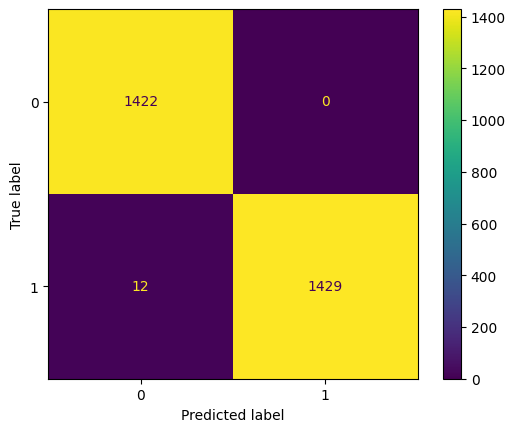

In [ ]:
print("Decision Tree confusion Matrix:")
conf_matrix_plot(tree, X_val, y_val)

Random Forest confusion Matrix:


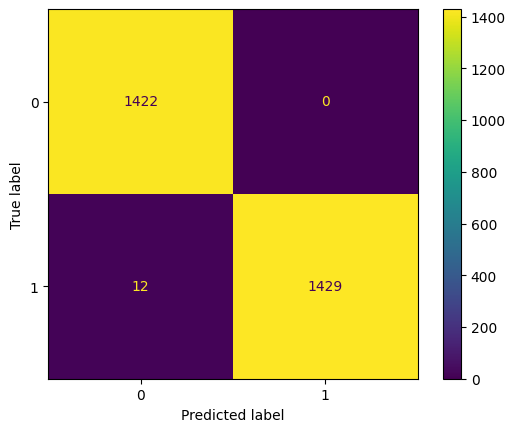

In [ ]:
print("Random Forest confusion Matrix:")
conf_matrix_plot(rf_cv, X_val, y_val)

XGboosting confusion Matrix:


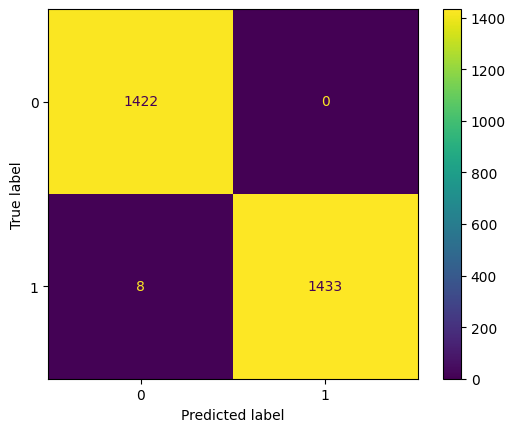

In [ ]:
#XGBoosting confusion Matrix:
print("XGboosting confusion Matrix:")
conf_matrix_plot(xgb_cv, X_val, y_val)

All 3 models perform pretty well, having an amount of false positive and false negative really small.

However, the one performing better is the XGboosting model. As aforementioned, it is also the model with the highest F1 score.

Therefore, the XGBoosting is our champion model. From now on, we will consider just it and assess it on the test data.

VALIDATION

Cross-validation is one of the most widespread validation technique. Still, validation can be done also by splitting the training dataset once again and save some data for validation.

We have already chosen our champion model. Therefore, we will employ this validation technique just on that, verifying if it improves predictions.

Note. To do that, we must tell the model the exact rows of X-train are for training and which are for validation.

In [ ]:
# Create list of split indexes
split_index = [0 if x in X_val.index else -1 for x in X_train.index]
custom_split = PredefinedSplit(split_index)

In [ ]:
#define the girdsearch
xgb_cv_sep = GridSearchCV(xgb, xgb_params, scoring=scoring, cv=custom_split, refit='f1')

In [ ]:
#fit the model
#xgb_cv_sep.fit(X_train, y_train)

In [ ]:
#pickle the model
#with open(path+'xgb_Sepval_model.pickle', 'wb') as to_write:
 #  pickle.dump(xgb_cv_sep, to_write)

In [ ]:
#read the pickled model
with open(path+'xgb_Sepval_model.pickle', 'rb') as to_read:
    xgb_cv_sep = pickle.load(to_read)

Let's now check the best parameters and compare that with those of xgb with cross validation.

In [ ]:
#separate validatio
xgb_cv_sep.best_params_

{'learning_rate': 0.2,
 'max_depth': 4,
 'min_child_weight': 5,
 'n_estimators': 75}

In [ ]:
#cross validation
xgb_cv.best_params_

{'learning_rate': 0.1,
 'max_depth': 5,
 'min_child_weight': 1,
 'n_estimators': 100}

Parameters are a little different than those from the cross-validation. 
We will investigate this a little bit before forecasting.

In [ ]:
print("Best model's F1 score:")

print("Cross-validation:", xgb_cv.best_score_)

print("Separate validation:", xgb_cv_sep.best_score_)

Best model's F1 score:
Cross-validation: 0.9953336022918648
Separate validation: 0.9954751131221719


Separate validation overall achieves a best F1 score. To clear every doubts, let's show the confusion matrix:

Cross Validation Confusion Matrix:


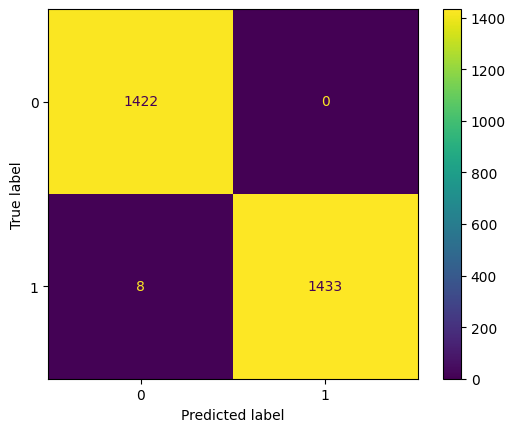

Separate Validation Confusion Matrix:


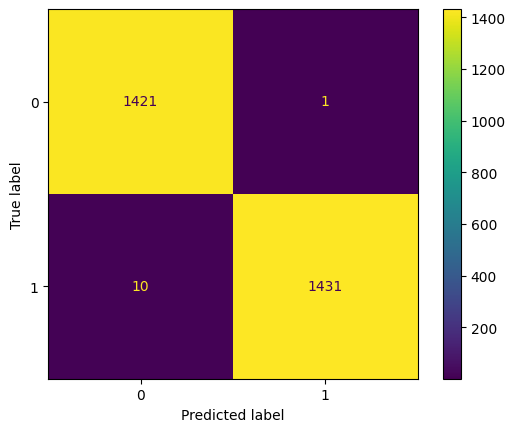

In [ ]:
print("Cross Validation Confusion Matrix:")
conf_matrix_plot(xgb_cv.best_estimator_, X_val, y_val)
print("Separate Validation Confusion Matrix:")
conf_matrix_plot(xgb_cv_sep.best_estimator_, X_val, y_val)

The Confusion Matrix shows a slightly better perfomance in the cross-validated model. Therefore, we opt for that.

TESTING & EVALUATION

Once a model has been selected, it is time to make predictions. 

In [ ]:
#predict on tests data
xgb_pred = xgb_cv.predict(X_test)

In [ ]:
#show the predictions
print(xgb_pred)

[1 1 1 ... 1 0 1]


Let's examine evaluation metrics for the champion model.

In [ ]:
#get various accuracy measure
print('F1 score final XGB model: ', f1_score(y_test, xgb_pred))
print('Recall score final XGB model: ', recall_score(y_test, xgb_pred))
print('Precision score final XGB model: ', precision_score(y_test, xgb_pred))
print('Accuracy score final XGB model: ', accuracy_score(y_test, xgb_pred))

F1 score final XGB model:  0.9930947897049592
Recall score final XGB model:  0.9879267277268943
Precision score final XGB model:  0.9983172065628944
Accuracy score final XGB model:  0.9930832110668623


These scores are really good. Altogether, they show a very precise model less likely to incurr in errors. 
To understand how likely the possibility of errors is, let's the confusion Matrix.

Champion xgb model Confusion Matrix:


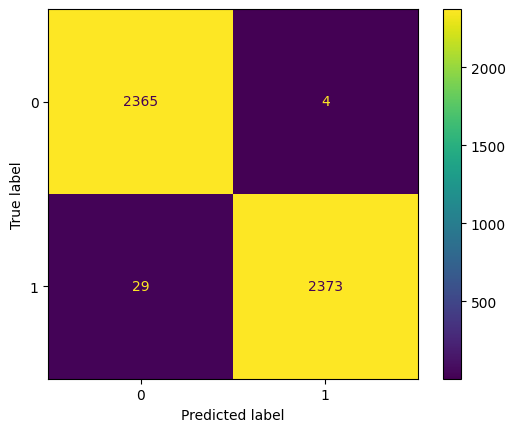

In [ ]:
#champion model confusion matrix
print("Champion xgb model Confusion Matrix:")
conf_matrix_plot(xgb_cv.best_estimator_, X_test, y_test)

Moreover, let's study which features have the most predictive power with a feature importance chart.

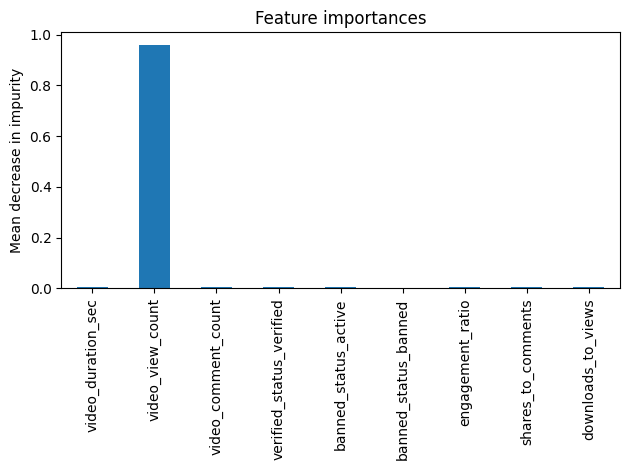

In [ ]:
#feature importance 
importances = xgb_cv.best_estimator_.feature_importances_
xgb_importances = pd.Series(importances, index=X_test.columns)

fig, ax = plt.subplots()
xgb_importances.plot.bar(ax=ax)
ax.set_title('Feature importances')
ax.set_ylabel('Mean decrease in impurity')
fig.tight_layout()

As reasonable, the feature with the most importance is the video view count.

RECOMMENDATIONS & FINAL INSIGHTS

- F1 score is very high. This means the model has a strong balance between precision and recall. It is an excellent measure of the model's overall performance, especially when dealing with imbalanced classes.
- Recall score indicates the model ability of identifying true positives (.e correctly identifying relevant instances). Since the score is close to 1, it shows model ability to capture almost all the cases without missing many.
- Precision score is high as well. Therefore, if a model predicts a positive outcome, it is almost always (99,8% of the time) correct.
- Accuracy is really close to 1. The model is correct in its predictions most of the time. 

The final recommendation is that the model is ready for deployment. Indeed, it should perform reasonably well on never seen data.

However, it is crucial to continuously monitor the model's performance as it interacts with real-world data. Successfully doing this can lead to further model optimization.

Additionally, the model should be regularly updated as new data becomes available. This process will help fine-tune the model and improve its performance over time.